# Baseline model analysis - image reconstruction

In [1]:
import os

os.chdir("../..")

In [2]:
!pwd

/Users/wiktorlazarski/Desktop/my_project/edge-aware-face-autoencoder


In [3]:
import random

import torch
import torchvision
import torchvision.transforms.functional as F

import face_autoencoder.reconstruction_pipeline as rec_pipeline
import scripts.training.data_loading as dl

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12, 10)
plt.rcParams["image.cmap"] = "gray"
plt.rcParams['savefig.facecolor'] = "white"

%load_ext autoreload
%autoreload 2

In [4]:
TEST_DSET_PATH = os.path.join(".", "data", "dataset", "test")

MODEL_PATH = os.path.join(".", "face_autoencoder", "model", "edgeaware-edge_weight10.ckpt")

In [5]:
dset = dl.CelebAFaceAutoencoderDataset(dataset_root=TEST_DSET_PATH)

reconstruction_pipeline = rec_pipeline.VAEReconstructionPipeline(model_path=MODEL_PATH)

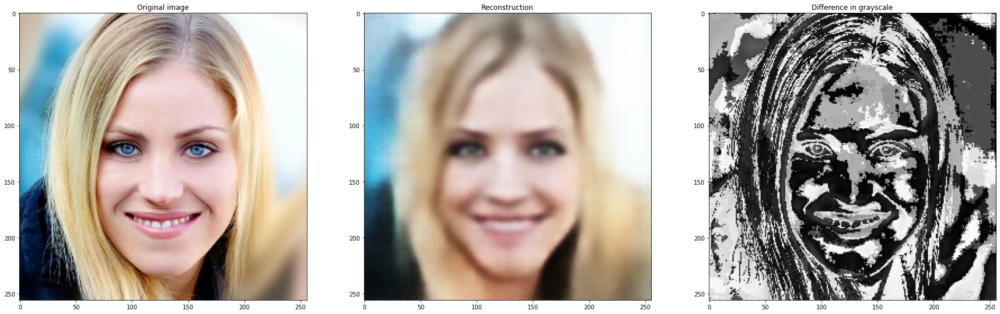

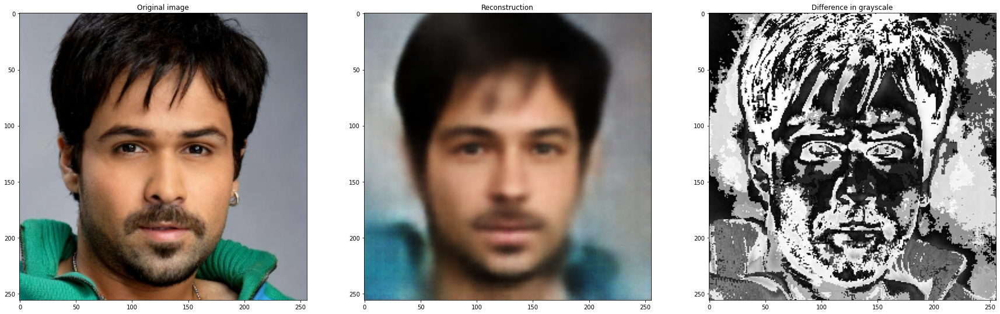

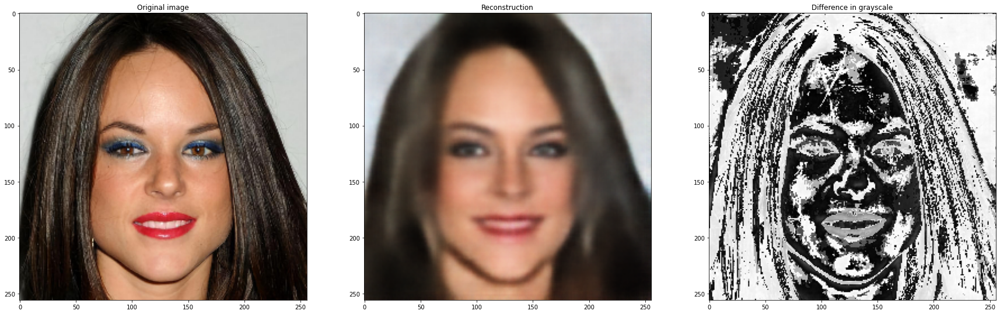

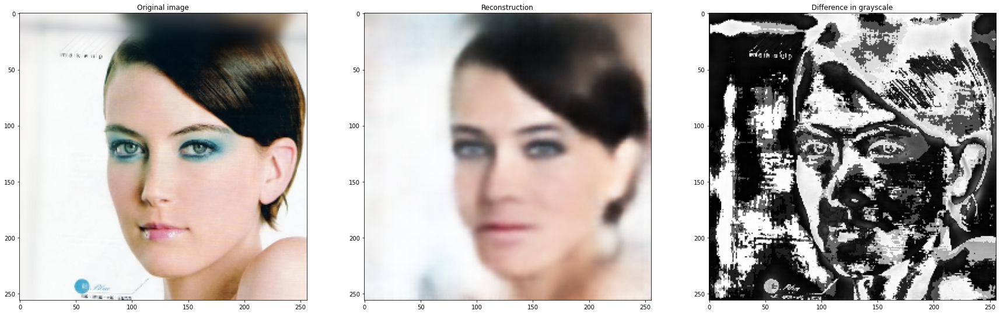

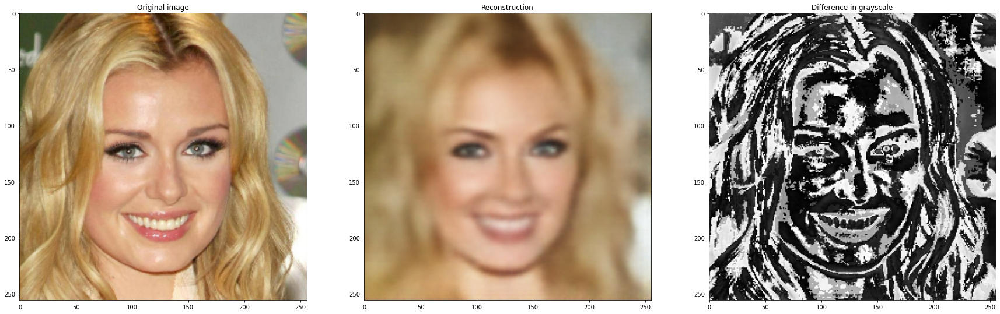

In [6]:
plt.close("all")
for i in range(5):
    img = dset[random.randrange(0, len(dset), 1)]
    reconstruction = reconstruction_pipeline(img)

    f, a = plt.subplots(1, 3, figsize=(30, 10))

    resized_img = cv2.resize(img, (256, 256))

    a[0].imshow(resized_img)
    a[0].set_title("Original image")

    a[1].imshow(reconstruction)
    a[1].set_title("Reconstruction")

    diff_img = resized_img - reconstruction 
    diff_img = (diff_img - diff_img.min()) / (diff_img.max() - diff_img.min()) * 255
    diff_img = diff_img.astype(np.uint8)
    diff_img = cv2.cvtColor(diff_img, cv2.COLOR_RGB2GRAY)

    a[2].imshow(diff_img, cmap="gray")
    a[2].set_title(f"Difference in grayscale")

In [7]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(40, 40))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    return fig

In [8]:
list_i = "1435 1825 43 936 172 1169 500 2692 111 1517 2549 2249 1430 2160 457 2011 464 493 20 2284 2914 262 1908 2322 109 1514 497 2302 499 2752 1645 417"
idxs = [int(idx) for idx in list_i.split(" ")]
    

In [12]:
#idxs = []
imgs = []
recons = []
for idx in idxs:
    #idx = random.randrange(0, len(dset), 1)
    #idxs.append(idx)
    img = dset[idx]
    
    reconstruction = reconstruction_pipeline(img)
    
    imgs.append(torch.tensor(img).permute(2,0,1))
    recons.append(torch.tensor(reconstruction).permute(2,0,1))

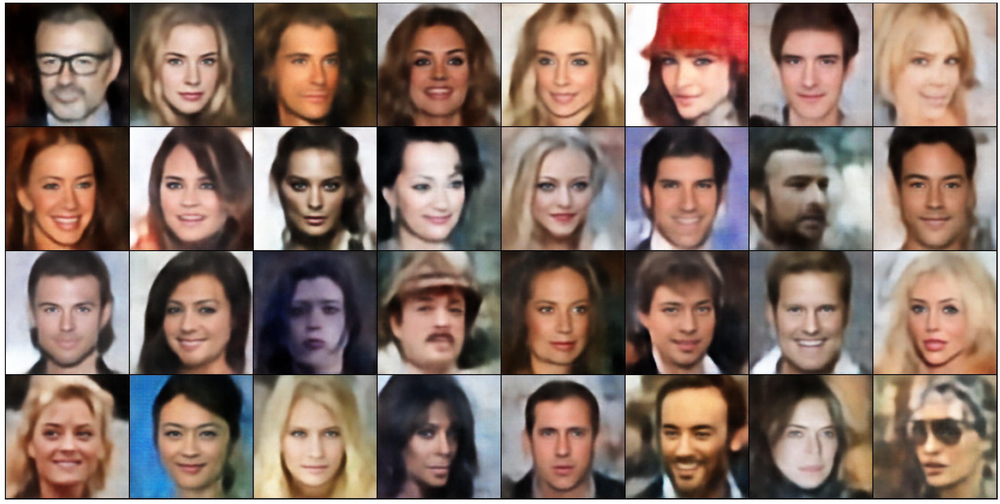

In [13]:
recons_grid = torchvision.utils.make_grid(recons)
recon_fig = show(recons_grid)
recon_fig.savefig("recon_imgs.png", format="png", bbox_inches='tight')

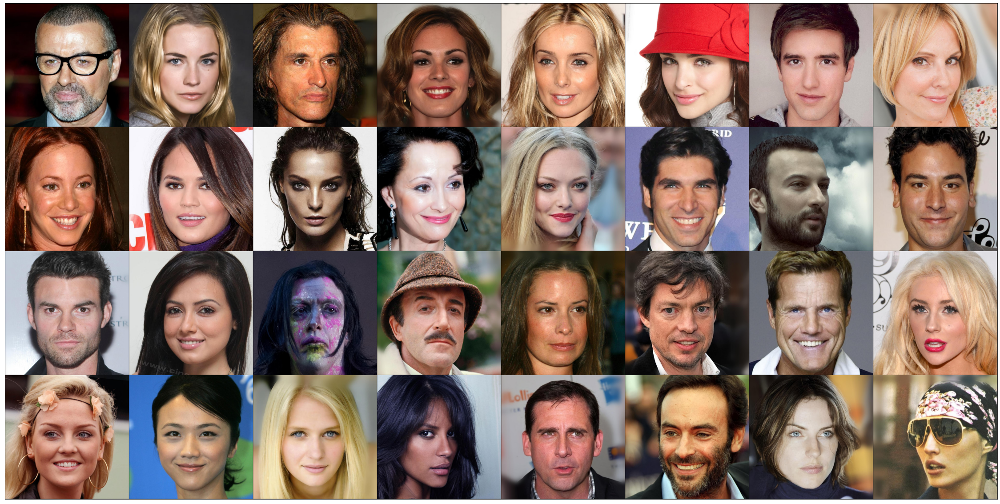

In [11]:
imgs_grid = torchvision.utils.make_grid(imgs)
original_fig = show(imgs_grid)
original_fig.savefig("original_imgs.png", format="png", bbox_inches='tight')